In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from esmpy.datasets.base import generate_spim
from esmpy.estimators import SmoothNMF
from esmpy.measures import find_min_angle, find_min_MSE, ordered_mse, ordered_mae, ordered_r2, ordered_kl
import numpy
from scipy import signal
from scipy.optimize import linprog
from curses.panel import bottom_panel
import hyperspy.api as hs
import esmpy.datasets as ds
import time
from scipy import ndimage
from msc_thesis.nmf_algorithm import runNMF
from msc_thesis.plotting import plot_synthetic_dataset, plot_results_report
from msc_thesis.binning import bin_dataset_3D, bin_dataset_2D
from msc_thesis.convolution import get_smoothed_dataset, build_noncentral_filter_weights, remove_spatial_margins
from msc_thesis.datasets import get_experimental_dataset, get_toy_dataset
import matplotlib


In [3]:

spim176= hs.load("../../generated_datasets/71GPa_synthetic_N176.hspy")
spim100= hs.load("../../generated_datasets/71GPa_synthetic_N100.hspy")
spim50= hs.load("../../generated_datasets/71GPa_synthetic_N50.hspy")

e_offset = spim50.axes_manager[-1].offset 
e_scale = spim50.axes_manager[-1].scale 
e_size = 1980


;....................................


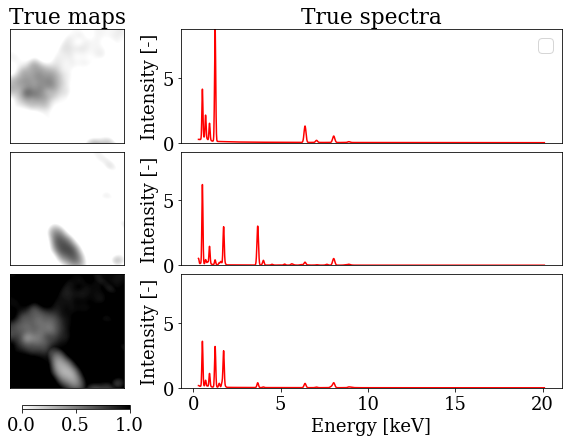

In [8]:
Dtilde, Htilde, Htilde_vol, Y_vol, G, K = get_experimental_dataset(spim176, (128,128))
plot_synthetic_dataset(Dtilde, Htilde,  np.linspace(e_offset,e_offset+e_size*e_scale,num=Dtilde.shape[0]),128,128)

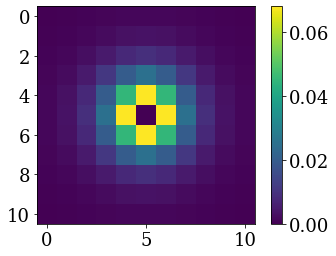

In [9]:
# Recommend keeping isFake = True for the experimental dataset. Otherwise the quadratic programing fails to provide a good filter. You can (aggresively) pre-bin the dataset to aim to get better results 
noncentral_weights = build_noncentral_filter_weights(Y_vol, 10000, (1,11,11), isFake=True)[0,:,:]

# Plot the filter
plt.imshow(noncentral_weights[:,:])
plt.colorbar()
plt.show()

In [10]:
# NMF parameters
N_iterations = 10       # Number of iterations for each NMF run
lambda_, mu_ = 0,0      # Regularization parameters 

# Generate dataset
Dtilde, Htilde, Htilde_vol, Y_vol, G, K = get_experimental_dataset(spim176, crop_size=(128,128))

# === Binning ===

resultsconvolution = []

# Convolve Y_vol with filter of noncentral weights to obtain Y_n (see report)
Y_n_vol = get_smoothed_dataset(Y_vol, noncentral_weights)

# Crop margins to disregard voxels for which complete set of neighbours does not exist
Y_vol_crop = remove_spatial_margins(Y_vol, noncentral_weights.shape)
Y_n_vol_crop = remove_spatial_margins(Y_n_vol, noncentral_weights.shape)
Htilde_vol_crop = remove_spatial_margins(Htilde_vol, noncentral_weights.shape)

alphas = np.linspace(0,1,11)
for alpha in alphas:
    # Run NMF and save experiment results
    nmf_run = runNMF(Dtilde, Htilde_vol_crop.reshape(K,-1), lambda_, mu_, [(1,1,1)], alpha, N_iterations, 0, Y_vol_crop, Y_n_vol_crop, G)

    # Store result
    resultsconvolution.append(nmf_run)

# Restructure results for better access
resultsconvolution = list(zip(*resultsconvolution))
angles_convolution, r2s_convolution, times_convolution, mses_convolution, kls_convolution = resultsconvolution[0], resultsconvolution[1], resultsconvolution[2], resultsconvolution[3], resultsconvolution[4]

# === Binning ===
resultsbinning = []

B_3Ds = [(1,1,1),(1,2,2),(1,4,4),(1,8,8),(1,16,16),(1,32,32),(1,64,64)] 
for B_3D in B_3Ds:
    # Run NMF and save experiment results
    nmf_run = runNMF(Dtilde, Htilde, lambda_, mu_, [B_3D], -1, N_iterations, 0, Y_vol, None, G)

    # Store result
    resultsbinning.append(nmf_run)

# Restructure results for better access
resultsbinning = list(zip(*resultsbinning))
angles_binning, r2s_binning, times_binning, mses_binning, kls_binning = resultsbinning[0], resultsbinning[1], resultsbinning[2], resultsbinning[3], resultsbinning[4]


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 10.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 11.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 10.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


# Plots Figure 35
Binning, convolution, and their side-to-side comparison of the effect they have on the quality of the resulting spectra and spatial maps using the ‘experimental’ dataset

In [1]:
# Plot Figure 35.b
fig, ax1 = plt.subplots(figsize = (7,7))
alphas = np.linspace(0,1,11)
for i in range(0,len(r2s_convolution)):
    plt.annotate(str(alphas[i])[:3], xy=(r2s_convolution[i]-0.01, angles_convolution[i]), size=20, va='center',ha='left')

plt.scatter(r2s_convolution, angles_convolution)
plt.plot(r2s_convolution, angles_convolution, linestyle = 'dashed')
plt.xlim(.8, 0.05)
plt.title("Avg. R2 and angle error for different values of " + r"$\alpha$")
plt.xlabel(r'$R^2(H, \tilde{H})$ [-]')
plt.ylabel(r'$\theta(W, \tilde{W})$ [deg]')
plt.grid()
plt.show()

# Plot Figure 35.a
fig, ax1 = plt.subplots(figsize = (7,7))
for i in range(0,len(r2s_binning)):
    plt.annotate(str(B_3Ds[i][0]*B_3Ds[i][1]*B_3Ds[i][2]), xy=(r2s_binning[i]-0.01, angles_binning[i]), size=20, va='center',ha='left')

plt.scatter(r2s_binning, angles_binning)
plt.plot(r2s_binning, angles_binning, linestyle = 'dashed')
plt.xlim(0.8, -0.25)
plt.title("Avg. R2 and angle error for different binning factors")
plt.xlabel(r'$R^2(H, \tilde{H})$ [-]')
plt.ylabel(r'$\theta(W, \tilde{W})$ [deg]')
plt.grid()
plt.show()

# Plot overlayed binning and convolution - Figure 35.c
fig, ax1 = plt.subplots(figsize = (7,7))
alphas = [i/10 for i in range(11)]
plt.annotate(r'$\alpha = 1$', xy=(r2s_convolution[-1]-0.01, angles_convolution[-1]),  size=20, va='center',ha='left', color='C1')
plt.annotate(r'$\alpha = 0$', xy=(r2s_convolution[0]-0.01, angles_convolution[0]),  size=20, va='center',ha='left', color='C1')
# Note: annotation is shifted down to avoid overlap (requested by Adrien)
plt.annotate(r'$B= 1$', xy=(r2s_binning[0]-0.01, angles_binning[0]-0.5),  size=20, va='center',ha='left', color='C0')
plt.annotate(r'$B = 4096$', xy=(r2s_binning[-1]-0.01, angles_binning[-1]),  size=20, va='center',ha='left', color='C0')
plt.scatter(r2s_binning, angles_binning)
plt.scatter(r2s_convolution, angles_convolution)
plt.plot(r2s_binning, angles_binning, linestyle = 'dashed')
plt.plot(r2s_convolution, angles_convolution, linestyle = 'dashed')

plt.xlim(0.8, -0.35)
plt.legend([
    "Binning",
    "Convolution"
], framealpha=1)
plt.title("Comparison binning vs convolution")
plt.xlabel(r'$R^2(H, \tilde{H})$ [-]')
plt.ylabel(r'$\theta(W, \tilde{W})$ [deg]')
plt.grid()
plt.show()

NameError: name 'plt' is not defined

# Plots Figure 32 and 33
$MSE(\breve{Y},\tilde{Y})$ and $D_{GKL}(\tilde{Y}||\breve{Y})$ of the NMF outcome as a function of the smoothing parameters ($B$ for binning and $\alpha$ for smoothing on the ‘experimental’ dataset. The metrics as a function of $\alpha$ are evaluated in the domain $[0,1]$ in intervals of $0.1$. Using the ‘experimental’ dataset.

/var/folders/dy/w1x934hd6fz67rjp2g6s1grc0000gn/T/ipykernel_68321/3201718164.py:4: MatplotlibDeprecationWarning: The 'basex' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  ax1.set_xscale('log', basex=2)


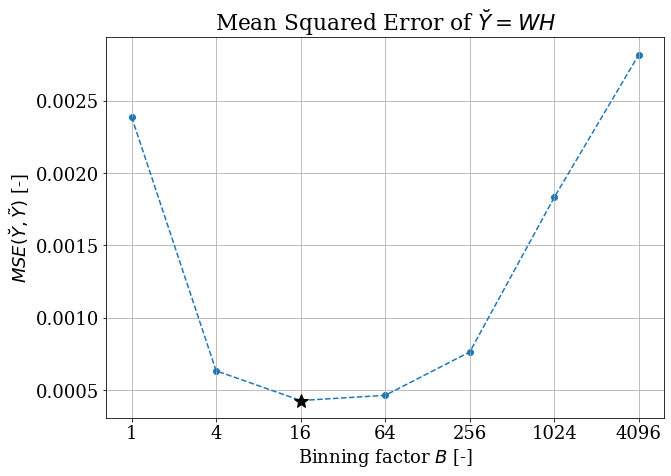

ValueError: x and y must have same first dimension, but have shapes (11,) and (5,)

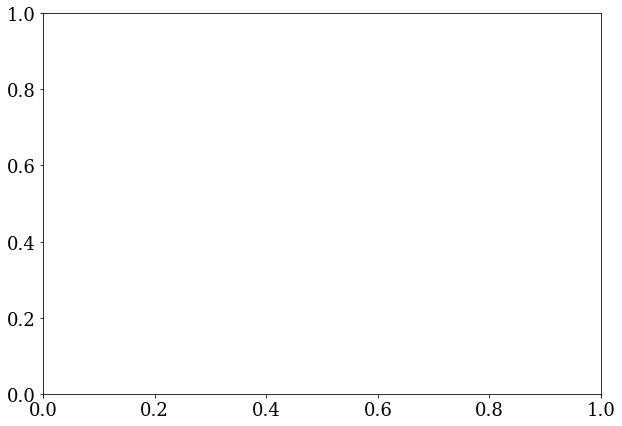

In [25]:
# Plot Figure 32.a
fig, ax1 = plt.subplots(figsize = (10,7))
bfs = [1,4,16,64,256,1024,4096]
ax1.set_xscale('log', basex=2)
ax1.set_xticks(bfs)
ax1.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
ax1.get_xaxis().get_major_formatter().labelOnlyBase = False
min_B = np.argmin(mses_binning)
plt.plot(bfs,mses_binning,linestyle='dashed')
ax1.plot([bfs[min_B]], [mses_binning[min_B]], 'k*', markersize=15)
plt.scatter(bfs,mses_binning)
plt.title('Mean Squared Error of '+r'$\breve{Y} = WH$')
plt.xlabel("Binning factor $B$ [-]")
plt.ylabel(r'$MSE(\breve{Y}, \tilde{Y})$ [-]')
plt.grid()
plt.show()

# Plot Figure 32.b
fig, ax1 = plt.subplots(figsize = (10,7))
alphas = np.linspace(0,1,11)
min_alpha = np.argmin(mses_convolution)
plt.plot(alphas,mses_convolution,linestyle='dashed')
ax1.plot([alphas[min_alpha]], [mses_convolution[min_alpha]], 'k*', markersize=15)
ax1.set_xticks(np.array(alphas))
plt.scatter(alphas,mses_convolution)
plt.title('Mean Squared Error of '+r'$\breve{Y} = WH$')
plt.xlabel(r"$\alpha$ [-]")
plt.ylabel(r'$MSE(\breve{Y}, \tilde{Y})$ [-]')
plt.grid()
plt.show()

# Plot Figure 33.a
fig, ax1 = plt.subplots(figsize = (10,7))
ax1.set_xscale('log', basex=2)
ax1.set_xticks(bfs)
ax1.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
ax1.get_xaxis().get_major_formatter().labelOnlyBase = False
plt.plot(bfs,kls_binning,linestyle='dashed')
min_B = np.argmin(kls_binning)
ax1.plot([bfs[min_B]], [kls_binning[min_B]], 'k*', markersize=15)
plt.scatter(bfs,kls_binning)
plt.title('Generalized Kullback-Leibler divergece of '+r'$\breve{Y} = WH$')
plt.xlabel("Binning factor $B$ [-]")
plt.ylabel(r'$D_{GKL}(\tilde{Y} || \breve{Y})$ [-]')
plt.grid()
plt.show()


# Plot Figure 33.b
fig, ax1 = plt.subplots(figsize = (10,7))
alphas = np.linspace(0,1,11)
plt.plot(alphas,kls_convolution,linestyle='dashed')
min_alpha = np.argmin(kls_convolution)
ax1.plot([alphas[min_alpha]], [kls_convolution[min_alpha]], 'k*', markersize=15)
ax1.set_xticks(np.array(alphas))
plt.scatter(alphas,kls_convolution)
plt.title('Generalized Kullback-Leibler divergece of '+r'$\breve{Y} = WH$')
plt.xlabel(r"$\alpha$ [-]")
plt.ylabel(r'$D_{GKL}(\tilde{Y} || \breve{Y})$ [-]')
plt.grid()
plt.show()





# Comparative Analysis: All variants
- Computation time on my machine with N_iterations = 10 approx 4 mins with G=G

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 10.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 10.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
exits because of relative change rel_A -5.709596281920315 or rel_P 0.0 < tol 
Stopped after 1 iterations in 0.0 minutes and 2.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 10.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 2.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
;....................................
{'N': 100, 'data_folder': 'None', 'model': 'EDXS', 'seed': 43, 'weight_type': 'data', 'densities': [1.2, 1.0, 0.8], 'weights_params': array([[[0.        , 0.05837955, 0.94162045],
        [0.        , 0.05735297, 0.94264703],
        [0.        , 0.05499701, 0.94500299],
        ...,
        [0.        , 0.        , 1.        ],
        [0.        , 0.        , 1.        ],
        [0.        , 0.        , 1.        ]],

       [[0.        , 0.04932969, 0.95067031],
        [0.        , 0.04834995, 0.95165005],
        [0.        , 0.04608505, 0.95391495],
        ...,
        [0.        , 0.        , 1.        ],
        [0.        , 0.        , 1.        ],
        [0.        , 0.        , 1.        ]],

       [[0.        , 0.03188602, 0.96811398],
        [0.        , 0.03099917, 0.96900083],
        [0.        , 0.02891692, 0.97108308],
        

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 10.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 10.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
exits because of relative change rel_A -11.110692665506397 or rel_P 0.0 < tol 
Stopped after 1 iterations in 0.0 minutes and 2.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
exits because of relative change < tol: 0.00082513936440875
Stopped after 2 iterations in 0.0 minutes and 3.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 2.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 11.0 seconds.
;....................................


/Users/maxmartinezruts/Documents/GitHub/esmpy/msc_thesis/plotting.py:70: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (21,11))
/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 10.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
exits because of relative change rel_A -27.566259800727988 or rel_P 0.0 < tol 
Stopped after 1 iterations in 0.0 minutes and 2.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
exits because of relative change < tol: 0.0006517011116571906
Stopped after 2 iterations in 0.0 minutes and 3.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 2.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
;....................................


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because max_iteration was reached
Stopped after 10 iterations in 0.0 minutes and 1.0 seconds.
;....................................


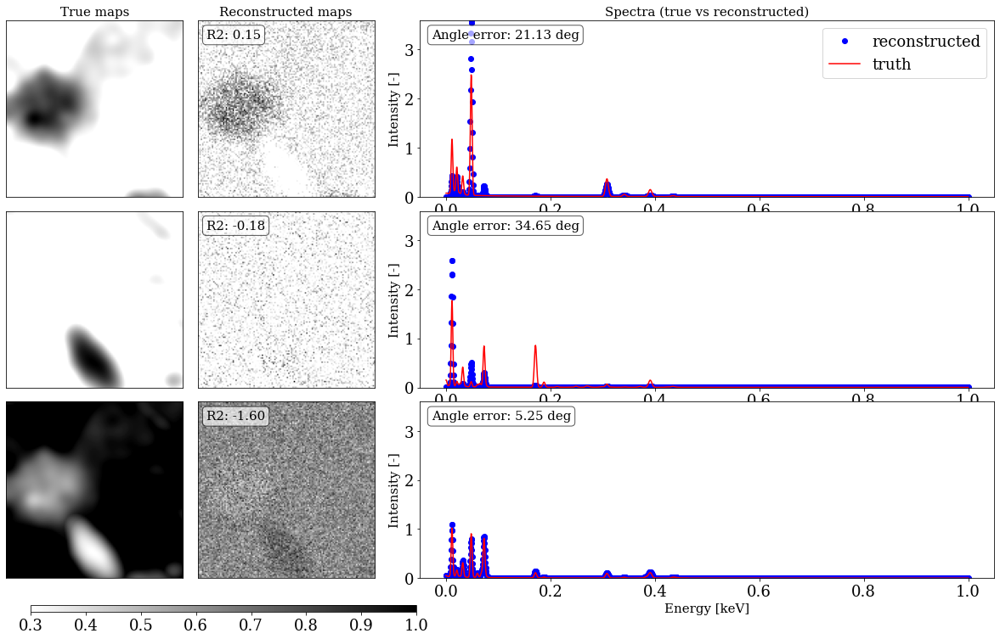

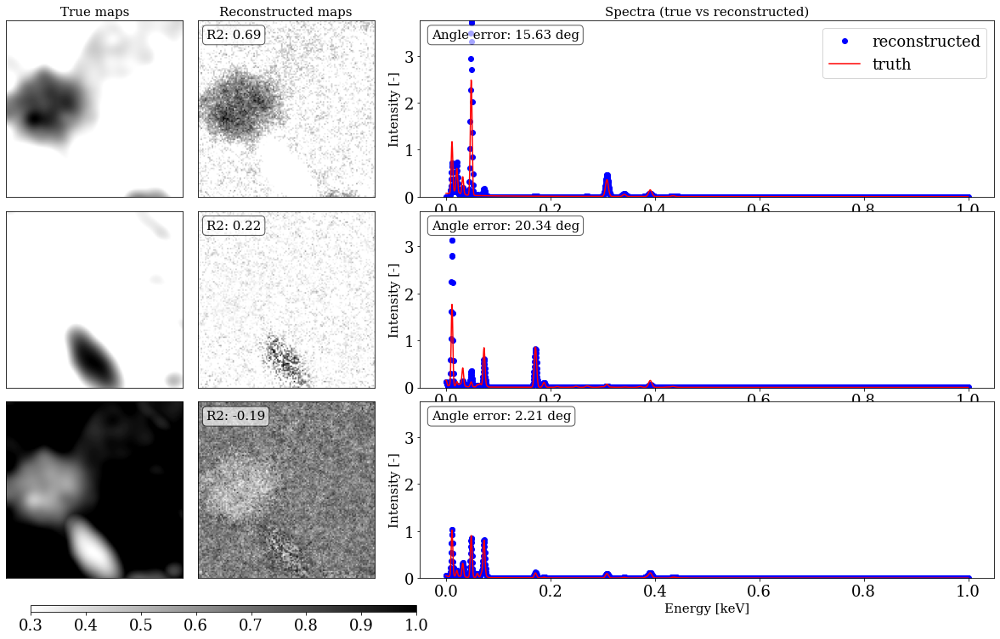

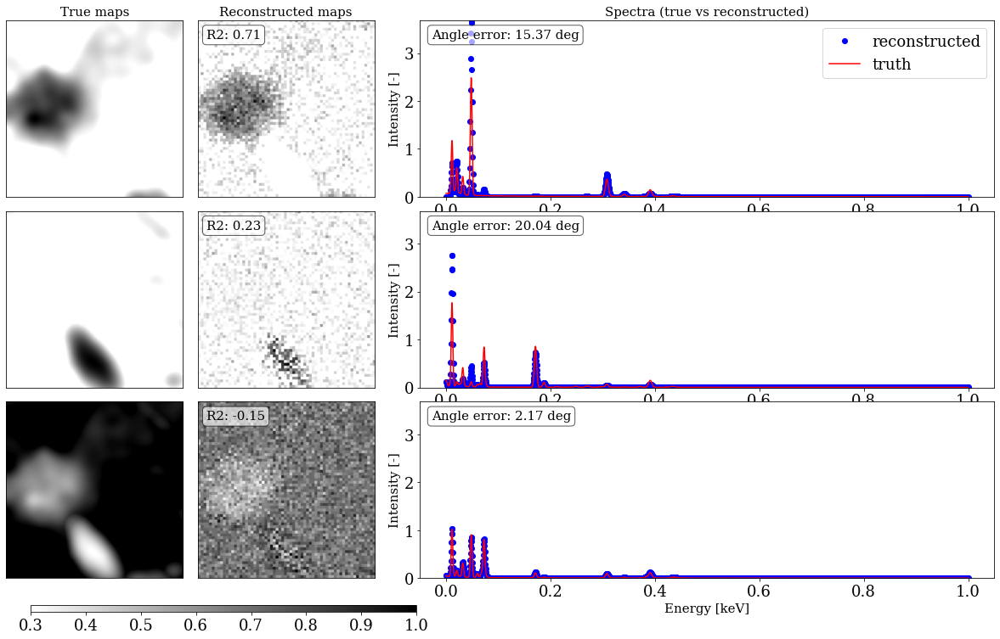

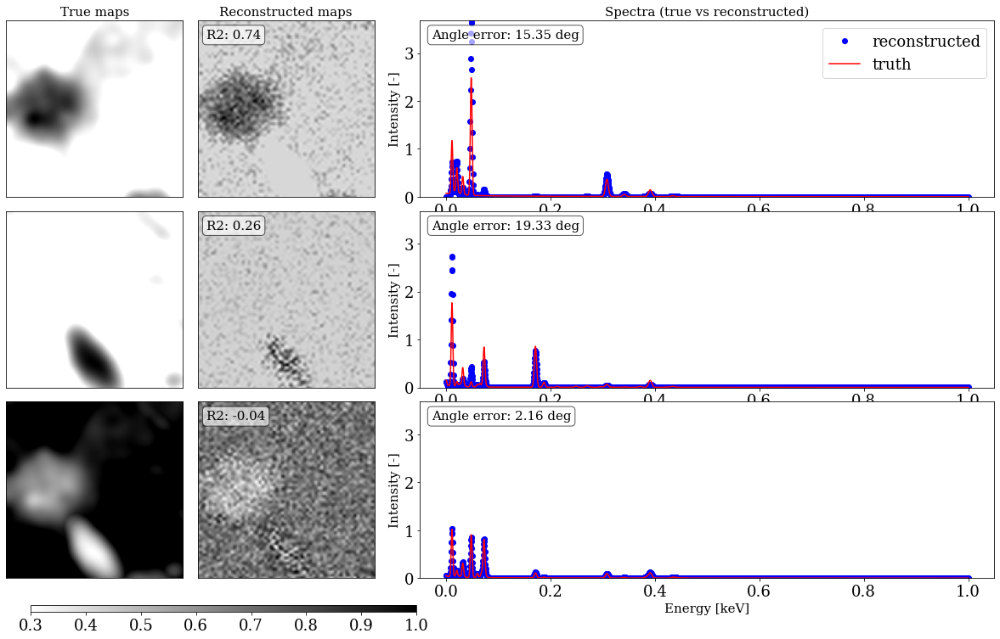

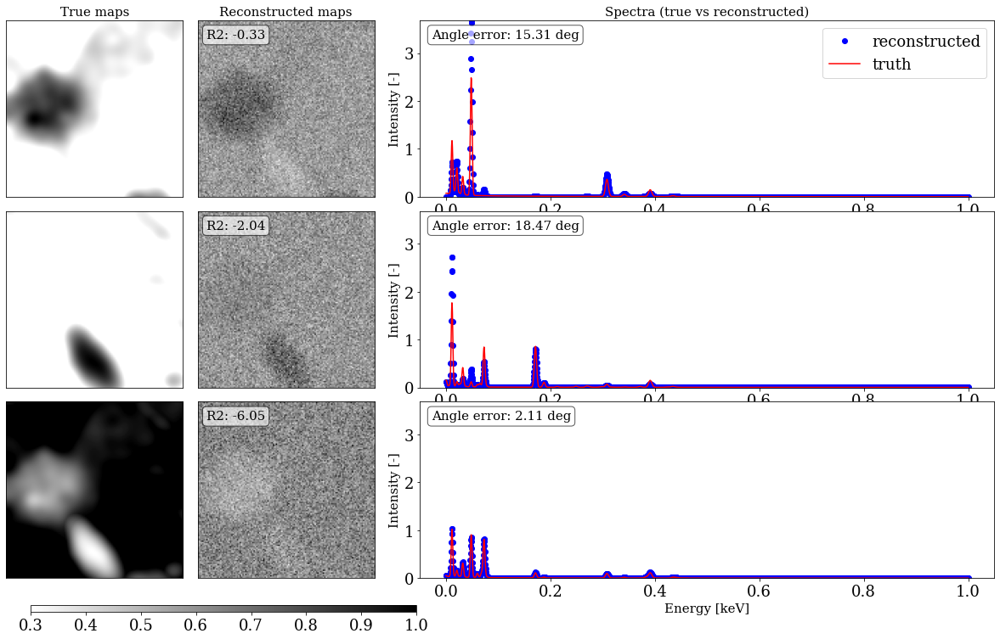

...

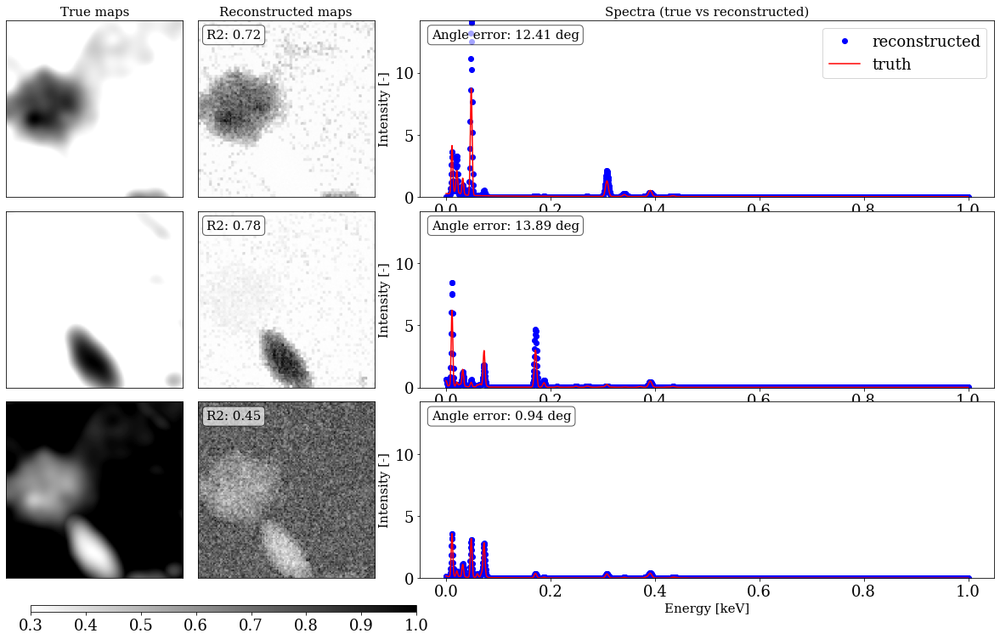

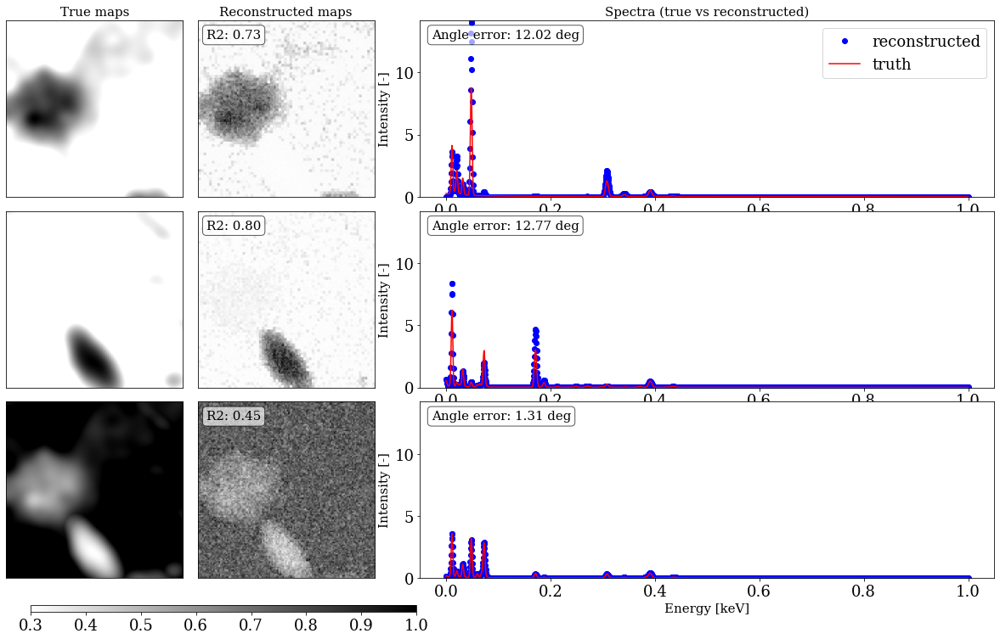

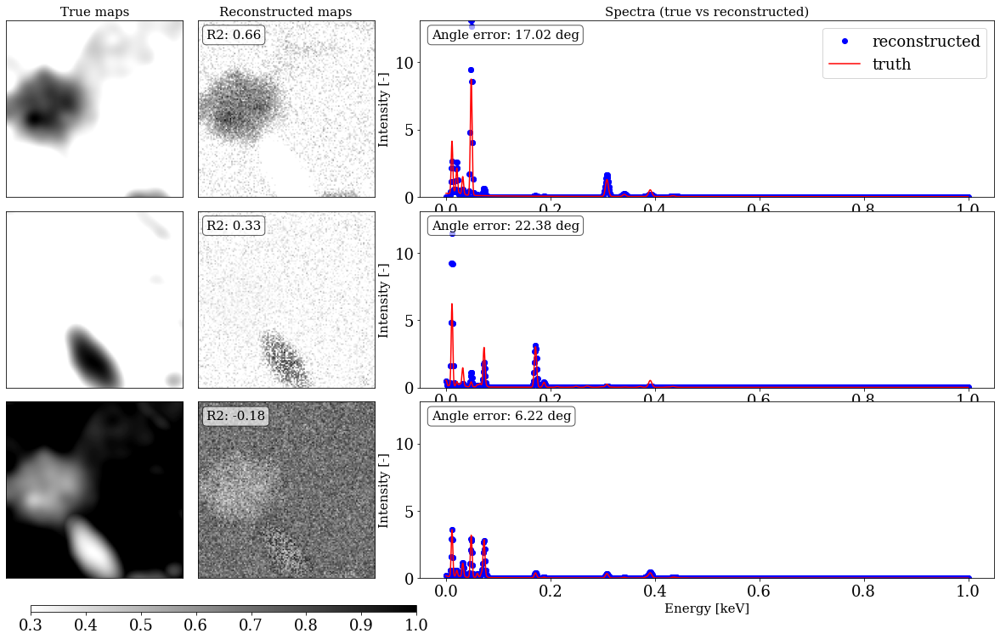

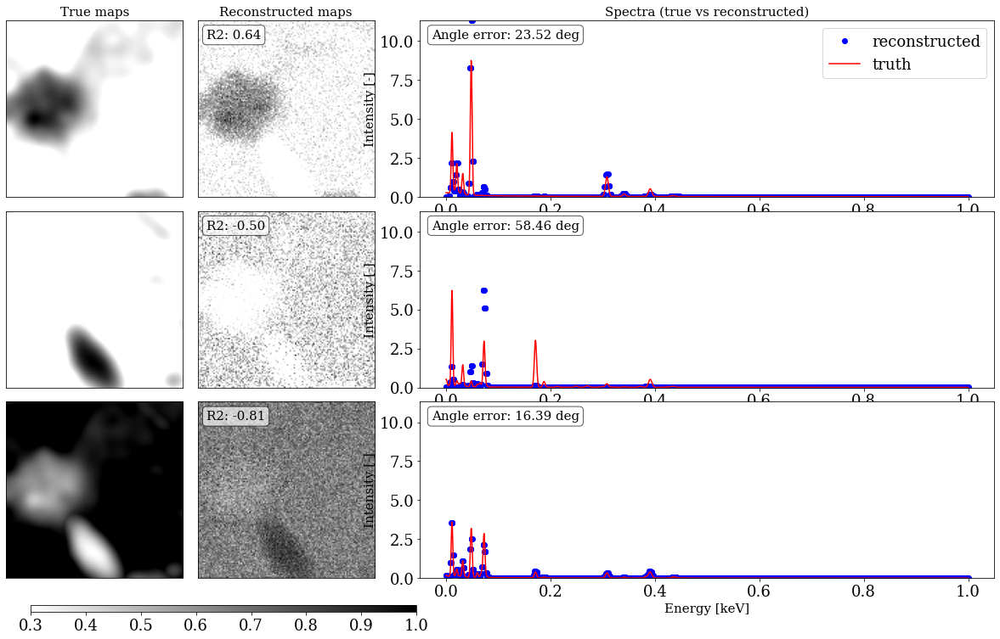

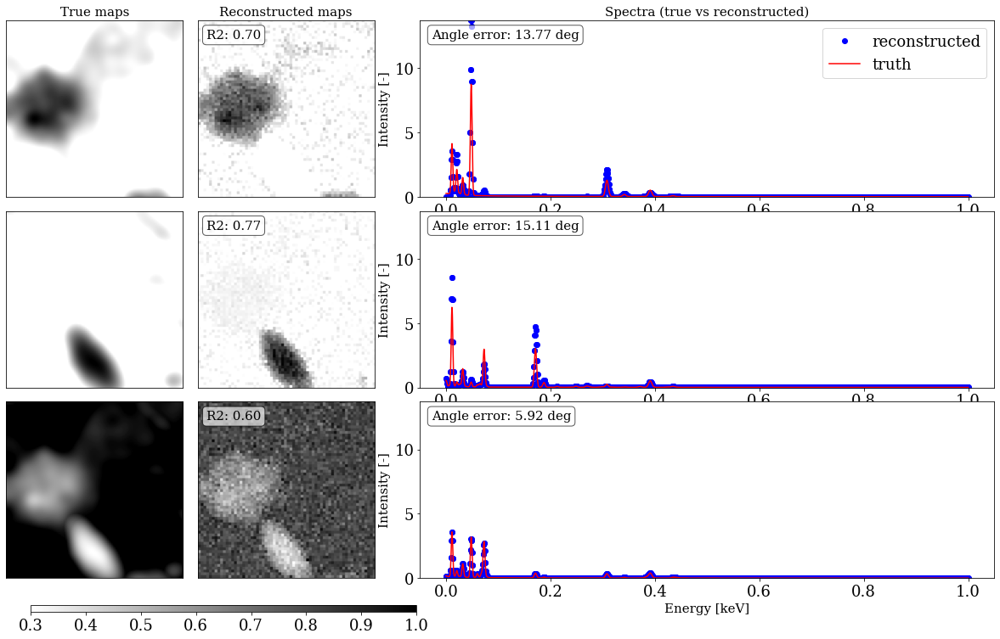

In [31]:
import time

# Run the experiments for three different datasets generated with different expected Poisson numbers N
datasets = [spim50, spim100, spim176]
N_iterations = 10
Ns = [50, 100, 176]
results = {}

for N, spim in zip(Ns, datasets):

    params = [    
        {'lambda':0, 'mu':0, 'B_size':[(1,1,1)], 'alpha':-1, 'upscaling_method':0, 'label':'baseline'},                                        # Baseline
        # {'lambda':0.1, 'mu':0.1, 'B_spatial':[1], 'alpha':-1, 'upscaling_method':0, 'label':'regularization'},                               # Regularization
        {'lambda':0, 'mu':0, 'B_size':[(1,1,1)], 'alpha':0.5, 'upscaling_method':0, 'label':'convolution_05'},                                 # Convolution, alpha = 0.5
        {'lambda':0, 'mu':0, 'B_size':[(1,2,2)], 'alpha':-1, 'upscaling_method':0, 'label':'binning_1x2x2_upsampling'},                        # Spatial binning (upsampling)
        {'lambda':0, 'mu':0, 'B_size':[(1,2,2)], 'alpha':-1, 'upscaling_method':1, 'label':'binning_1x2x2_interpolation'},                     # Spatial binning (interpolation)
        {'lambda':0, 'mu':0, 'B_size':[(1,2,2)], 'alpha':-1, 'upscaling_method':2, 'label':'binning_1x2x2_linearregression'},                  # Spatial binning (least squares)
        {'lambda':0, 'mu':0, 'B_size':[(1,2,2),(1,1,1)], 'alpha':-1, 'upscaling_method':3, 'label':'binning_1x2x2_multupdates'},               # Spatial binning (mult. updates)
        {'lambda':0, 'mu':0, 'B_size':[(1,2,2),(1,1,1)], 'alpha':-1, 'upscaling_method':0, 'label':'binning_4_1_multires'},                    # Spatial binning (multires)
        {'lambda':0, 'mu':0, 'B_size':[(2,1,1)], 'alpha':-1, 'upscaling_method':0, 'label':'binning_spectral_2x1x1'},                          # Spectral (upsampling B = 2)
        {'lambda':0, 'mu':0, 'B_size':[(5,1,1)], 'alpha':-1, 'upscaling_method':0, 'label':'binning_spectral_5x1x1'},                          # Spectral (upsampling B = 5)
        {'lambda':0, 'mu':0, 'B_size':[(2,2,2)], 'alpha':-1, 'upscaling_method':0, 'label':'binning_volumetric_2x2x2'},                        # Volumetric (upsampling 2x2x2)
    ]
    results[N] = {}
    Dtilde, Htilde, Y_vol, G = get_experimental_dataset(spim)
    Y_vol_smooth = get_smoothed_dataset(Y_vol, noncentral_weights)

    for i in range(len(params)):
        # Run NMF and save experiment results
        nmf_run = runNMF(Dtilde, Htilde, params[i]['lambda'], params[i]['mu'], params[i]['B_size'], params[i]['alpha'], N_iterations, params[i]['upscaling_method'], Y_vol, Y_vol_smooth, G)

        # Store result
        results[N][params[i]['label']]= nmf_run



# Figure 36
Comparative analysis of all smoothing methods explored in this report applied on three instances of the ‘experimental’ dataset with different expected Poisson numbers (N = 50, N = 100 and N = 176). Measured metrics are: angle error (left), R2 score (center) and computation time (right). Note: the baseline consists of an NMF run with no regularization and no preprocessing of the input Y

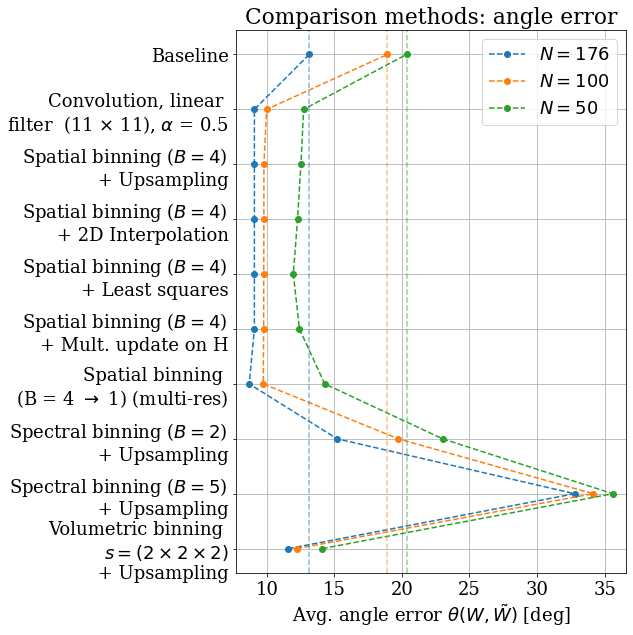

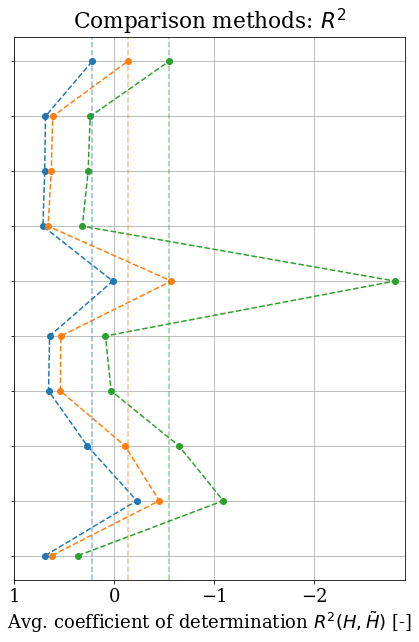

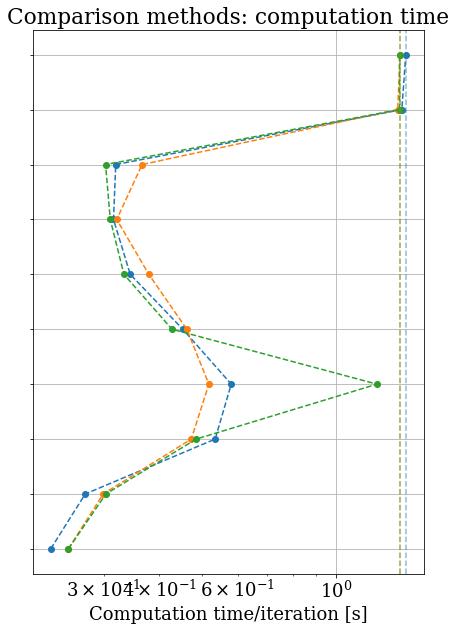

In [35]:
Y_labels = [
    "Baseline",
     "Convolution, linear \nfilter  "+ r"(11 $\times$ 11), $\alpha$ = 0.5",
    "Spatial binning ($B = 4$) \n + Upsampling",
    "Spatial binning ($B = 4$) \n+ 2D Interpolation",
    "Spatial binning ($B = 4$) \n+ Least squares",
    "Spatial binning ($B = 4$) \n+ Mult. update on H",
    "Spatial binning \n("+ r"B = 4 $\rightarrow$ 1"+") (multi-res)",
    "Spectral binning ($B = 2$) \n + Upsampling",
    "Spectral binning ($B = 5$) \n + Upsampling",
    "Volumetric binning \n"+r"$s = (2 \times 2 \times 2)$"+"\n + Upsampling"
][::-1]
Y_labels = np.arange(len(Y_labels))

# Plot angle error
fig = plt.figure(figsize = (7,10))
r50 =  np.flip(np.array([list(results[50].values())[i][0] for i in range(len(results[50]))]))
r100 = np.flip(np.array([list(results[100].values())[i][0] for i in range(len(results[100]))]))
r176 =  np.flip(np.array([list(results[176].values())[i][0] for i in range(len(results[176]))]))
plt.plot(r176,Y_labels , marker="o", linestyle="--",  color="C0")
plt.plot(r100,Y_labels , marker="o", linestyle="--",  color="C1")
plt.plot(r50,Y_labels , marker="o", linestyle="--",  color="C2")
plt.axvline(r176[-1], color='C0', linestyle='dashed', alpha = 0.5)
plt.axvline(r100[-1], color='C1', linestyle='dashed', alpha = 0.5)
plt.axvline(r50[-1], color='C2', linestyle='dashed', alpha = 0.5)
plt.yticks(Y_labels, X)
plt.xlabel("Avg. angle error "+r'$\theta(W, \tilde{W})$ [deg]')
plt.title("Comparison methods: angle error")
plt.legend(["$N = 176$", "$N = 100$", "$N=50$"])
plt.xlim(np.min(r176)-1,np.max(r50)+1)
plt.grid()
plt.show()

# Plot r2
fig = plt.figure(figsize = (7,10))
r50 =  np.flip(np.array([list(results[50].values())[i][1] for i in range(len(results[50]))]))
r100 = np.flip(np.array([list(results[100].values())[i][1] for i in range(len(results[100]))]))
r176 =  np.flip(np.array([list(results[176].values())[i][1] for i in range(len(results[176]))]))
plt.plot(r176,Y_labels , marker="o", linestyle="--",  color="C0")
plt.plot(r100,Y_labels , marker="o", linestyle="--", color="C1")
plt.plot(r50,Y_labels , marker="o", linestyle="--", color="C2")
plt.axvline(r176[-1], color='C0', linestyle='dashed', alpha = 0.5)
plt.axvline(r100[-1], color='C1', linestyle='dashed', alpha = 0.5)
plt.axvline(r50[-1], color='C2', linestyle='dashed', alpha = 0.5)
plt.yticks(Y_labels, [])
plt.xlim(1,np.min(r50)-0.1)
plt.xlabel("Avg. coefficient of determination "+r'$R^2(H, \tilde{H})$ [-]')
plt.title("Comparison methods: $R^2$")
plt.grid()
plt.show()

# Plot computation time
fig = plt.figure(figsize = (7,10))
r50 =  np.flip(np.array([list(results[50].values())[i][2] for i in range(len(results[50]))]))
r100 = np.flip(np.array([list(results[100].values())[i][2] for i in range(len(results[100]))]))
r176 =  np.flip(np.array([list(results[176].values())[i][2] for i in range(len(results[176]))]))
plt.plot(r176/10,Y_labels , marker="o", linestyle="--", color="C0")
plt.plot(r100/10,Y_labels , marker="o", linestyle="--",color="C1")
plt.plot(r50/10,Y_labels , marker="o", linestyle="--", color="C2")
plt.axvline(r176[-1]/N_iterations, color='C0', linestyle='dashed', alpha = 0.5)
plt.axvline(r100[-1]/N_iterations, color='C1', linestyle='dashed', alpha = 0.5)
plt.axvline(r50[-1]/N_iterations, color='C2', linestyle='dashed', alpha = 0.5)
plt.yticks(Y_labels, [])
plt.xscale('log')
plt.xlabel("Computation time/iteration [s]")
plt.title("Comparison methods: computation time")
plt.grid()
plt.show()

